In [1]:
import sys
sys.path.append("../")
sys.path.append("../../project/deepYeast/")

In [2]:
from cvat.convert_format import Convert_Format,  target_file_list

In [3]:
from cellmating.utils import file_traverse
from cellmating.io import imread, imsave
import numpy as np
import os
from tqdm import tqdm, trange
import matplotlib.pyplot as plt

In [4]:
image_root = "/media/wlli/T7 Shield/Data/patch/20240607_2scd2_gfp_002"
image_list = file_traverse(image_root, file_regular=r".*_rigid.tif$")
seg_list = file_traverse(image_root, file_regular=r".*_rigid_seg.tif$")

In [5]:
for i in range(0, len(image_list)):
    print(image_list[i])
    image = imread(image_list[i])
    segment = imread(seg_list[i])
    image = np.concatenate([image, segment[:,:,:,None]],axis=-1)
    del segment
    imsave(image_list[i][:-4]+"_merged.tif", image)
    del image

/media/wlli/T7 Shield/Data/patch/20240607_2scd2_gfp_002/1_rigid.tif
/media/wlli/T7 Shield/Data/patch/20240607_2scd2_gfp_002/2_rigid.tif
/media/wlli/T7 Shield/Data/patch/20240607_2scd2_gfp_002/3_rigid.tif
/media/wlli/T7 Shield/Data/patch/20240607_2scd2_gfp_002/4_rigid.tif
/media/wlli/T7 Shield/Data/patch/20240607_2scd2_gfp_002/5_rigid.tif
/media/wlli/T7 Shield/Data/patch/20240607_2scd2_gfp_002/6_rigid.tif


## Split image and convert to cvat to check

In [23]:
root = "/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/"
image_list = file_traverse(root, file_regular=".*.tif$")

In [24]:
image_list

['/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/01_homo.tif',
 '/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/02_homo.tif',
 '/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/03_mix.tif',
 '/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/04_big.tif',
 '/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/05_mix.tif',
 '/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/06_big.tif']

In [40]:
os.path.join(merged_image_path[:-4], "ref", os.path.basename(merged_image_path)[:-4]+"_"+str(i).zfill(4)+".tif")

'/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/05_mix/ref/05_mix_0786.tif'

In [41]:
for merged_image_path in tqdm(image_list):
    image = imread(merged_image_path)
    if not os.path.exists(merged_image_path[:-4]):
        os.mkdir(merged_image_path[:-4])
        os.mkdir(os.path.join(merged_image_path[:-4], "mask"))
        os.mkdir(os.path.join(merged_image_path[:-4], "ref"))
    for i in range(0, image.shape[0]):
        ref = image[i,:,:,0]
        mask = image[i,:,:,-1]
        ref_name = os.path.join(merged_image_path[:-4], "ref", os.path.basename(merged_image_path)[:-4]+"_"+str(i).zfill(4)+".tif")
        mask_name = os.path.join(merged_image_path[:-4], "mask", os.path.basename(merged_image_path)[:-4]+"_"+str(i).zfill(4)+".tif")
        imsave(ref_name, ref)
        imsave(mask_name, mask)

100%|█████████████████████████████████████████████| 6/6 [00:37<00:00,  6.31s/it]


####  mask to xml

In [71]:
root = "/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/"
foloder_list = os.listdir(root)
for i in range(6,12):
    folder = os.path.join(root, foloder_list[i], "mask")
    Convert_Format().mask2xml(folder, os.path.join(root, foloder_list[i], foloder_list[i]+".xml"), file_regular=".*.tif$")
    print(folder)

/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/01_homo/mask
/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/02_homo/mask
/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/03_mix/mask
/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/04_big/mask
/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/05_mix/mask
/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region/06_big/mask


### cvat to moive

In [5]:
from deepYeast.deeplab.postprocess.post_process_utils import post_process_panoptic

In [35]:
root = "/home/wlli/Downloads/job_41_annotations_2024_07_05_00_24_02_cityscapes 1.0/gtFine"
mask_list  = file_traverse(root, file_regular=r".*._gtFine_instanceIds.png$")

In [41]:
mask_movie = np.zeros((787, 528, 528), dtype=np.uint16)
for i in trange(0, len(mask_list)):
    image = imread(mask_list[i]).astype(np.uint16)
    image = post_process_panoptic(image, erosion_disk=15, expand_disk=15, area_threshold=300, clean_border_region=True)
    mask_movie[i] = image

100%|█████████████████████████████████████████| 787/787 [05:19<00:00,  2.47it/s]


In [44]:
save_root = "/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region"
folder = ("_").join(mask_list[0].split("/")[-1].split("_")[0:2])
imsave(os.path.join(save_root, folder, folder+"_mask.tif"), mask_movie)

### tracking

In [4]:
from cellmating.tracking._hausdorf_tracker import Tracker

In [7]:
root = "/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region"
folder = os.listdir(root)
mask_list = file_traverse(root, file_regular=r".*_mask.tif")
# image = imread("")

In [21]:
image_name = mask_list[0]


In [23]:
image_name = mask_list[2]
image = imread(image_name)
trace = Tracker(image, max_miss=10, min_hist=1, low_ratio=0.5, high_ratio=1.5, is_acc=True)
_ = trace()
traced_image = trace.to_image()
imsave(image_name[:-8]+"traced.tif", traced_image)

frame= 12 [] [1013]
divison: [[0 0 1]]
divison: [[0 0 1]]
divison: [[0 0 1]]
divison: [[0 0 1]]
divison: [[0 0 1]]
fusion: [[0 1 0]]
divison: [[0 0 1]]
fusion: [[0 1 0]]
frame= 449 [1008, 1017, 3014] [4018]
frame= 477 [4011] [4017]
divison: [[0 0 1]]
fusion: [[0 1 0]]
frame= 513 [1014] [1008]
divison: [[0 0 1]]
divison: [[0 0 1]]
frame= 583 [1006] [1002]
divison: [[0 0 1]]
fusion: [[0 1 0]]
divison: [[0 0 1]]
frame= 741 [1017] []
frame= 742 [4011] [2004]
frame= 745 [1004, 1005, 1005, 1017] [3012]
frame= 746 [1004, 1005, 1005] [3015]
frame= 747 [1004, 1005, 1005] [3017]
frame= 748 [1004, 1005, 1005] [3002]
frame= 749 [1004, 1005, 1005] [3011]
frame= 750 [1004, 1005, 1005] [3004]
frame= 751 [1004, 1005, 1005] [3017]
fusion: [[0 1 0]]
frame= 772 [3016] [3009]
divison: [[0 0 1]]
fusion: [[0 1 0]]
frame= 776 [4007] [4009]
frame= 777 [3010] [4001]
frame= 784 [1003] []


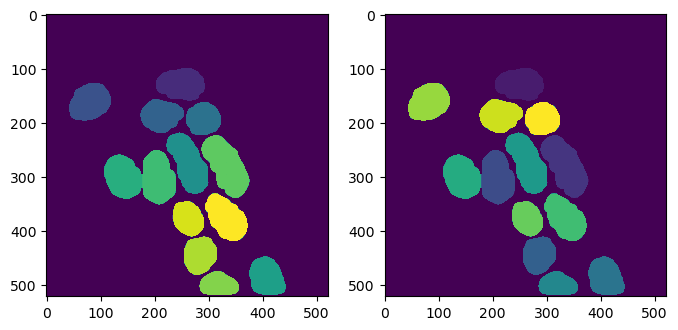

In [24]:
fig, axs = plt.subplots(1,2,figsize=(8, 15))
frame = 10
axs[0].imshow(image[frame], vmin=1000)
axs[1].imshow(traced_image[frame], vmin=1000)

#### patch detect

In [374]:
from cellmating.cells import create_cells_from_image_for_patch
from cellmating.patch import DynamicPatch, Singal
from cellmating.visualize import animate_patch
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [75]:
root = "/media/wlli/T7 Shield/Data/patch/20240606_2scd2_gfp_001/selected_region"
folder = os.listdir(root)
mask_list = file_traverse(root, file_regular=r".*_traced.tif")

In [78]:
image_name = mask_list[0]
mask_image = imread(image_name)
image = imread(image_name[:-11]+".tif")
image[:,:,:,-1] = mask_image
image = np.moveaxis(image, -1, 1)

In [79]:
cells = create_cells_from_image_for_patch(image[:,-1])
cells

{1: <cellmating.cells._cell.Cell at 0x7375cdd6e990>,
 2: <cellmating.cells._cell.Cell at 0x7375e37defd0>,
 3: <cellmating.cells._cell.Cell at 0x7375f85e8810>,
 4: <cellmating.cells._cell.Cell at 0x7375cdf57950>,
 5: <cellmating.cells._cell.Cell at 0x7375cde594d0>,
 6: <cellmating.cells._cell.Cell at 0x7375cdeb2050>,
 7: <cellmating.cells._cell.Cell at 0x7375cdeb2590>,
 8: <cellmating.cells._cell.Cell at 0x7375cdbe2790>,
 9: <cellmating.cells._cell.Cell at 0x7375cdccce90>,
 10: <cellmating.cells._cell.Cell at 0x7375ce6d1e50>,
 11: <cellmating.cells._cell.Cell at 0x7375cdd574d0>,
 12: <cellmating.cells._cell.Cell at 0x7375cdfdb9d0>,
 13: <cellmating.cells._cell.Cell at 0x7375e39c3210>,
 14: <cellmating.cells._cell.Cell at 0x7375cf12edd0>,
 15: <cellmating.cells._cell.Cell at 0x7375e37e3390>,
 16: <cellmating.cells._cell.Cell at 0x7375e3a94490>,
 17: <cellmating.cells._cell.Cell at 0x7375cecd9b50>,
 18: <cellmating.cells._cell.Cell at 0x7375e37fbc50>,
 19: <cellmating.cells._cell.Cell at 

In [95]:
label = 2
c = cells[label]
c.tracking_mask = image[:,-1]%1000
c.reference_image = image[:,0]
c.fluorescence_image = image[:,1:-2]
patch = DynamicPatch.from_cell(c)

In [375]:
intensity_data = patch.periphery_patch_intensity(percentile=85, channel=0, radius=7, dist=7)
signal_patch = Singal(data = patch.patch_intensity[:,:,0],
                      angles = patch.angle_,
                      frames = patch.frames,
                      coordinates = patch.coordinates_,
                      background = patch.background[:,0],
                      name = image_name)

print("perimeter:", np.sum(np.sqrt(np.sum(np.square(coord - np.roll(coord, shift=1, axis=0)), axis=1)))/60)

perimeter: 4.395505445691951


In [376]:
ani = patch_image(patch, time=[0, 100, 2])

In [377]:
HTML(ani.to_jshtml())

In [357]:
data = patch.patch_intensity

In [358]:
data.max(axis=0).shape

(60, 1)

In [102]:
# steps = signal_patch.transfer_steps()
# patch_data = signal_patch._patch_features
# x, y_patch = ked_fit(patch_data[:, 7], bw_adjust=0.25)

# distance_data = patch.neighbor_distance_angle
# x, y_dist = ked_fit(distance_data[0], bw_method=0.1, weights=distance_data[1].max() - distance_data[1])

# feature = patch_neighbor_distance_feature(x ,y_patch, y_dist)
# all_data += list(feature)

In [383]:
test = data - 100
test = test.clip(0, None)

In [393]:
np.nanmean(test, where=test>0, axis=1, keepdims=1).shape

(787, 1, 1)

In [368]:
np.nanmedian(data, axis=1, keepdims=1).shape

(787, 1, 1)

In [333]:
data / data.max(axis=0)

array([[[0.86342593],
        [0.86052512],
        [0.86007543],
        ...,
        [0.98419865],
        [0.96236162],
        [0.86611111]],

       [[0.88765432],
        [0.85080072],
        [0.80550918],
        ...,
        [1.        ],
        [0.96649446],
        [0.89027778]],

       [[0.85909091],
        [0.82915971],
        [0.80077908],
        ...,
        [0.92942062],
        [0.91168512],
        [0.85909091]],

       ...,

       [[0.77986111],
        [0.77522366],
        [0.76585977],
        ...,
        [0.7830905 ],
        [0.82583026],
        [0.77986111]],

       [[0.72037037],
        [0.71174179],
        [0.69449082],
        ...,
        [0.77451718],
        [0.76555966],
        [0.72037037]],

       [[0.81555556],
        [0.79243183],
        [0.75055648],
        ...,
        [0.86681716],
        [0.86521302],
        [0.81414141]]])